<a href="https://colab.research.google.com/github/shivam-kotwalia/data-science-101/blob/master/Image_preprocessingV1_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import imutils
import cv2
import sys
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
from pprint import pprint
from PIL import Image
from google.colab.patches import cv2_imshow
from skimage import io

In [0]:
np.set_printoptions(threshold=sys.maxsize, linewidth=120)

In [0]:
! wget -q -nv -N https://images-na.ssl-images-amazon.com/images/I/41qCVjLOs0L.jpg
! mv 41qCVjLOs0L.jpg image.jpg

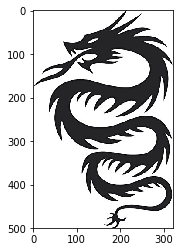

In [4]:
image = cv2.imread("image.jpg")
plt.imshow(image)
plt.show()

Max pixel in image is 255


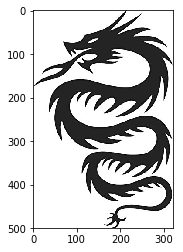

Shape of original image is (500, 321, 3)
and grayscale image is (500, 321)


In [5]:
# Grayscaling the image and Resizing 
print(f"Max pixel in image is {image.max()}")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap="gray")
plt.show()
print(f"Shape of original image is {image.shape}\nand grayscale image is {gray.shape}")

In [6]:
print(f'So grayscale image by cv2 is single channel image and max pixel is {gray.max()} and min is {gray.min()}')

So grayscale image by cv2 is single channel image and max pixel is 255 and min is 0


(498, 320)


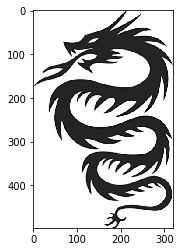

In [7]:
# Resizing the image with imutils 
gray_2 = imutils.resize(gray, 320, 400) #REMEMBER THIS IS WIDTH * HEIGHT 
plt.imshow(gray_2, cmap="gray")
print(gray_2.shape)

(498, 320)


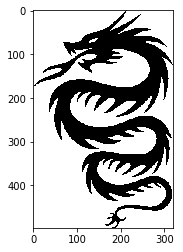

In [8]:
# SIMPLE THERSHOLDING 
gray_2[gray_2 > 150] = 255
gray_2[gray_2 <= 150] = 0
print(gray_2.shape)
plt.imshow(gray_2, cmap="gray")
plt.show()

In [0]:
! wget -N -q -nv https://upload.wikimedia.org/wikipedia/commons/thumb/c/c2/AdditiveColor.svg/2000px-AdditiveColor.svg.png
! mv 2000px-AdditiveColor.svg.png rgb.png

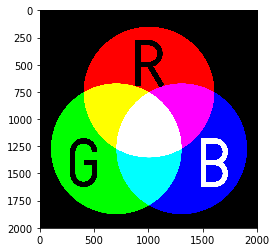

Shape - (2000, 2000, 3)


In [10]:
rgb_image = cv2.imread("rgb.png")
rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)
plt.imshow(rgb_image)
plt.show()
print(f"Shape - {rgb_image.shape}")

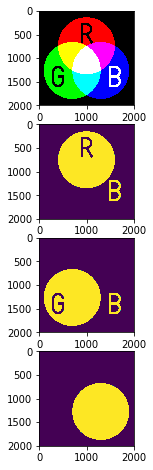

In [11]:
# Spliting into RGB can also be done by cv2.split
r, g, b = cv2.split(rgb_image)
plt.figure(figsize=(8, 8))
plt.subplot(4, 1, 1)
plt.imshow(rgb_image)

plt.subplot(4, 1, 2)
plt.imshow(r)

plt.subplot(4, 1, 3)
plt.imshow(g)

plt.subplot(4, 1, 4,)
plt.imshow(b)


### **Warning** : cv2.split() is a costly operation (in terms of time). So do it only if you need it. Otherwise go for Numpy indexing. 

Text(0.5, 1.0, 'Blue Channel')

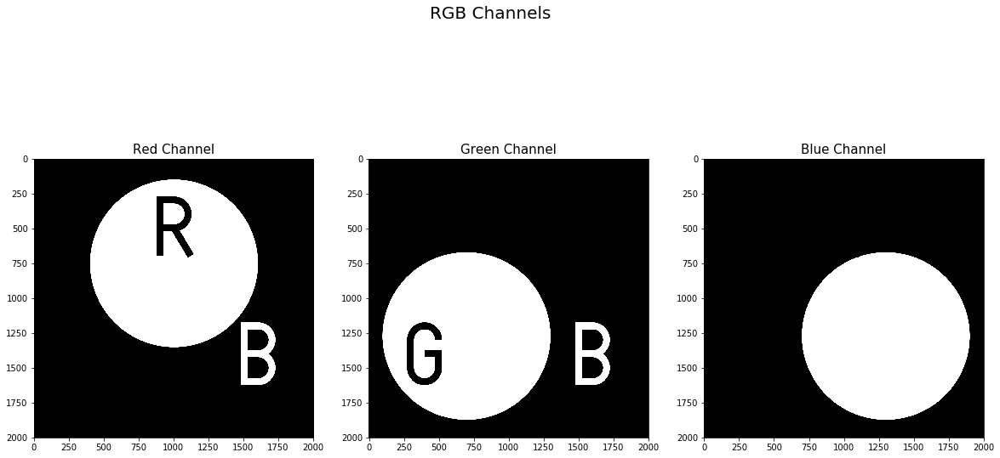

In [12]:
#Plotting all images together 
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
f.suptitle("RGB Channels ", fontsize=20)
ax1.imshow(rgb_image[:,:,0], vmin=0, vmax=255, cmap="gray" )
ax1.set_title("Red Channel", fontsize=15)

ax2.imshow(rgb_image[:,:,1], vmin=0, vmax=255, cmap="gray" )
ax2.set_title("Green Channel", fontsize=15)

ax3.imshow(rgb_image[:,:,2], vmin=0, vmax=255, cmap="gray")
ax3.set_title("Blue Channel", fontsize=15)

Take a look at the images above. The three images show you how each channel is composed of. In the R channel picture, the part with the high saturation of red colors looks white. Why is that? This is because the values in the red color parts will be near 255. And in grayscale mode, the higher the value is, the whiter the color becomes. You can also check this with G or B channels and compare how certain parts differ one from another.

OpenCV imports image in BGR order. BGR means the following:

    1st channel of the image is considered Blue
    2nd channel of the image is considered Green
    3rd channel of the image is considered Red

But when we display it in Matplotlib things appear to be a bit off. Thats because matplotlib reads interprets images as RGB. Thus when we display an image read by OpenCV in Matplotlib there occurs a color discrepancy. To correct this discrepancy, we need to convert the BGR OpenCV image into an RGB image. We can do this by calling a function cv2.cvtColor. An example is shown below

In [0]:
! wget -N -nv -q https://s29755.pcdn.co/wp-content/uploads/2018/10/shutterstock_324741074-1.jpg
! mv shutterstock_324741074-1.jpg veg.jpg
veg = cv2.imread("veg.jpg")

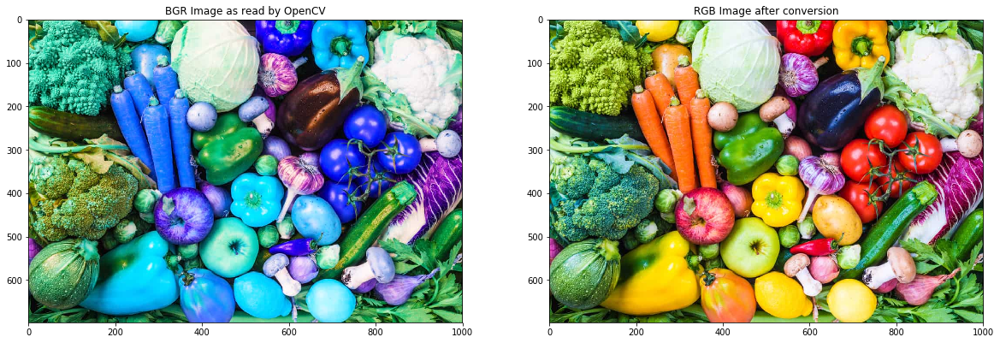

In [14]:
f ,(ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(veg)
ax1.title.set_text("BGR Image as read by OpenCV")

ax2.imshow(cv2.cvtColor(veg, cv2.COLOR_BGR2RGB))
ax2.title.set_text("RGB Image after conversion")

# Image Color Histogram

calcHist(images, channels, mask, histSize, ranges[, hist[, accumulate]]) -> hist

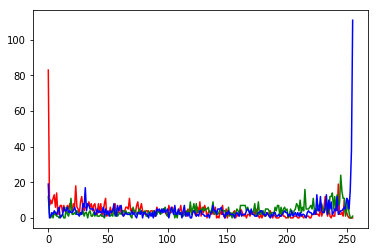

In [15]:
plt.plot(cv2.calcHist(veg[:,:,0], [0], None, [256], [0, 256]), color="red")
plt.plot(cv2.calcHist(veg[:,:,1], [0], None, [256], [0, 256]), color="green")
plt.plot(cv2.calcHist(veg[:,:,2], [0], None, [256], [0, 256]), color="blue")
plt.show()

# Convolution on images

filter2D(src, ddepth, kernel[, dst[, anchor[, delta[, borderType]]]]) -> dst

The function applies an arbitrary linear filter to an image. In-place operation is supported. When
* the aperture is partially outside the image, the function interpolates outlier pixel values
* according to the specified border mode.


The function does actually compute correlation, not the convolution:
 
.   \f[\texttt{dst} (x,y) =  \sum _{ \stackrel{0\leq x' < \texttt{kernel.cols},}{0\leq y' < \texttt{kernel.rows}} }  \texttt{kernel} (x',y')* \texttt{src} (x+x'- \texttt{anchor.x} ,y+y'- \texttt{anchor.y} )\f]

That is, the kernel is not mirrored around the anchor point. If you need a real convolution, flip the kernel using #flip and set the new anchor to 


`(kernel.cols - anchor.x - 1, kernel.rows -anchor.y - 1)`.
   
   
The function uses the DFT-based algorithm in case of sufficiently large kernels (~`11 x 11` or larger) and the direct algorithm for small kernels.

*  @param src input image.
*  @param dst output image of the same size and the same number of channels as src.
*  @param ddepth desired depth of the destination image, see @ref filter_depths "combinations"
*  @param kernel convolution kernel (or rather a correlation kernel), a single-channel floating point matrix; if you want to apply different kernels to different channels, split the image into  separate color planes using split and process them individually.
*  @param anchor anchor of the kernel that indicates the relative position of a filtered point within the kernel; the anchor should lie within the kernel; default value (-1,-1) means that the anchor is at the kernel center.
* @param delta optional value added to the filtered pixels before storing them in dst.
*  @param borderType pixel extrapolation method, see #BorderTypes
*  @sa  sepFilter2D, dft, matchTemplate

In [0]:
! wget -N -nv -q https://amp.businessinsider.com/images/5ba549ec39ce1aa61f8b4568-750-500.jpg
! mv 5ba549ec39ce1aa61f8b4568-750-500.jpg sky.jpg

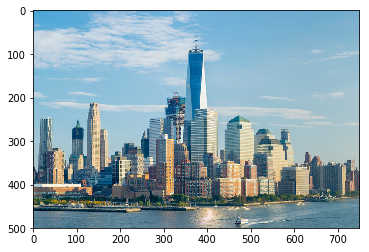

In [17]:
sky = cv2.imread("sky.jpg")
sky = cv2.cvtColor(sky, cv2.COLOR_BGR2RGB)
plt.imshow(sky, cmap="gray")

In [0]:
filter3 = np.ones((3, 3))/9
filter5 = np.ones((5, 5))/25

In [19]:
sky_filter3 = cv2.filter2D(sky, -1, filter3)
sky_filter5 = cv2.filter2D(sky, -1, filter5)
print(f"Shape of original image is {sky.shape}")
print(f"Shape of convoluted image is {sky_filter5.shape}")

Shape of original image is (500, 750, 3)
Shape of convoluted image is (500, 750, 3)


(254, 0)

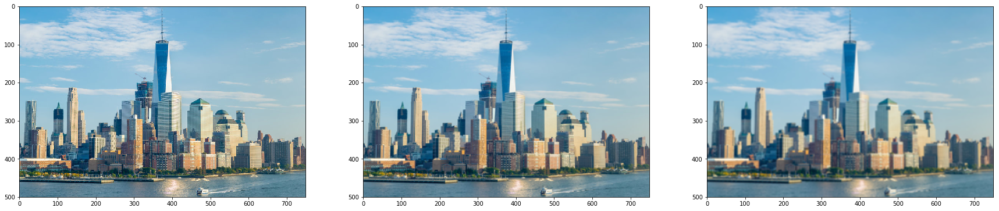

In [20]:
f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(30, 30))
ax1.imshow(sky, cmap="gray")
ax2.imshow(sky_filter3, cmap="gray")
ax3.imshow(sky_filter5, cmap="gray")
sky_filter3.max(),sky_filter3.min() 

### Edge Detection  
Reference - https://en.wikipedia.org/wiki/Kernel_(image_processing)


![alt text](https://ujwlkarn.files.wordpress.com/2016/08/screen-shot-2016-08-05-at-11-03-00-pm.png?w=342&h=562)

In [21]:
### Edge Detection 
edge_filter1 = np.array([[1, 0, -1],   [0, 0, 0],   [-1, 0, 1]])
edge_filter2 = np.array([[0, 1, 0],    [1, -4, 1],  [0, 1, 1]])
edge_filter3 = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])

print(edge_filter1, "\n\n",  edge_filter2, "\n\n", edge_filter3) 

[[ 1  0 -1]
 [ 0  0  0]
 [-1  0  1]] 

 [[ 0  1  0]
 [ 1 -4  1]
 [ 0  1  1]] 

 [[-1 -1 -1]
 [-1  8 -1]
 [-1 -1 -1]]


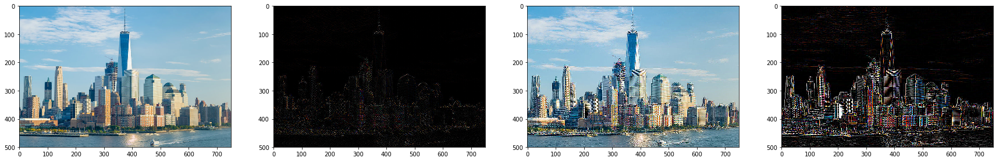

In [22]:
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 30))
ax1.imshow(sky, cmap="gray")
ax2.imshow(cv2.filter2D(sky, -1, edge_filter1), cmap="gray")
ax3.imshow(cv2.filter2D(sky, -1, edge_filter2), cmap="gray")
ax4.imshow(cv2.filter2D(sky, -1, edge_filter3), cmap="gray")

### Sharpen 

In [23]:

sharp_filter = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
print(sharp_filter)

[[ 0 -1  0]
 [-1  5 -1]
 [ 0 -1  0]]


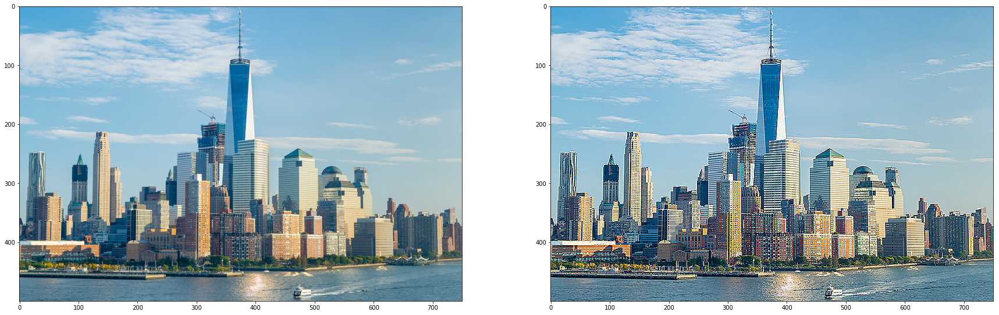

In [24]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 30))
ax1.imshow(sky, cmap="gray")
ax2.imshow(cv2.filter2D(sky, -1, sharp_filter), cmap="gray")

### Blur
GaussianBlur(src, ksize, sigmaX[, dst[, sigmaY[, borderType]]]) -> dst

medianBlur(src, ksize[, dst]) -> dst

In [0]:
blur_box = np.array([[1,1,1], [1,1,1], [1,1,1,]])/9
blur_gaussian = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])/16

Text(0.5, 1.0, 'Using in-build Gaussian Filter')

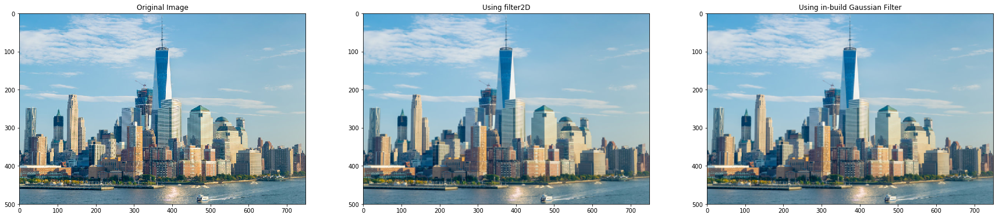

In [26]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 30))
# f.suptitle("Gaussian Blur", fontsize=50)
ax1.imshow(sky, cmap="gray")
ax1.set_title("Original Image")
ax2.imshow(cv2.filter2D(sky, -1, blur_gaussian), cmap="gray")
ax2.set_title("Using filter2D")

## Using standard bluring effects
ax3.imshow(cv2.GaussianBlur(sky, (3,3) , 0), cmap="gray")
ax3.set_title("Using in-build Gaussian Filter")

Text(0.5, 1.0, 'Median Blur')

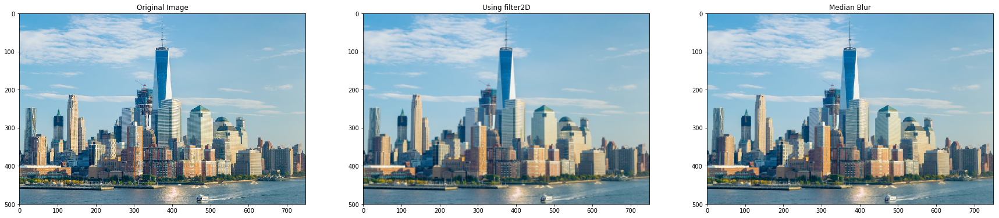

In [27]:
# Other Blurs
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 30))
# f.suptitle("Gaussian Blur", fontsize=50)
ax1.imshow(sky, cmap="gray")
ax1.set_title("Original Image")
ax2.imshow(cv2.filter2D(sky, -1, blur_box), cmap="gray")
ax2.set_title("Using filter2D")

## Using standard bluring effects
ax3.imshow(cv2.medianBlur(sky, 3), cmap="gray")
ax3.set_title("Median Blur")

### Sobel 

https://en.wikipedia.org/wiki/Sobel_operator

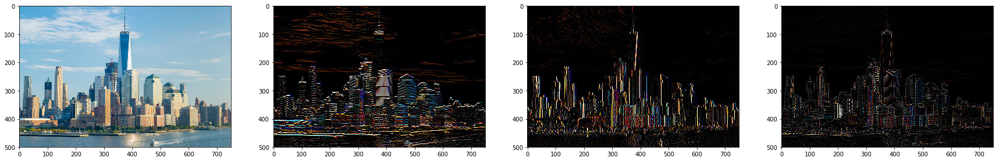

In [28]:
sobelx =    np.array([[1,2,1],  [0,0,0],  [-1,-2,-1]])
sobely =    np.array([[-1,0,1], [-2,0,2], [-1,0,1]])
laplacian = np.array([[0,-1,0], [-1,4,-1],[0,-1,0]])

# print(sobelx)
# print(sobely)
# print(laplacian)
gradientx = cv2.filter2D(sky, -1, sobelx)
gradienty = cv2.filter2D(sky, -1, sobely)
lapImg    = cv2.filter2D(sky, -1, laplacian)

f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize = (30,30))
ax1.imshow(sky, cmap='gray', vmin=0, vmax=255)
ax2.imshow(gradientx, cmap='gray', vmin=0, vmax=255)
ax3.imshow(gradienty, cmap='gray', vmin=0, vmax=255)
ax4.imshow(lapImg, cmap='gray', vmin=0, vmax=255)
plt.show()

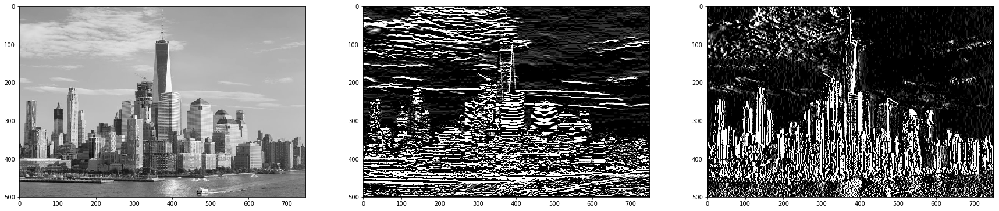

In [29]:
gray = cv2.cvtColor(sky, cv2.COLOR_RGB2GRAY)
gradientx = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=5)
gradienty = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=5)

f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (30,30))
ax1.imshow(gray, cmap='gray', vmin=0, vmax=255)
ax2.imshow(gradientx, cmap='gray', vmin=0, vmax=255)
ax3.imshow(gradienty, cmap='gray', vmin=0, vmax=255)
plt.show()

### Canny 

Canny(image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]]) -> edges

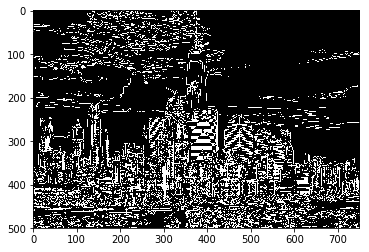

In [30]:
canny = cv2.Canny(sky, 5, 100)
plt.imshow(canny, cmap="gray", vmin=0, vmax=255)

In [0]:
! wget -N -q -nv https://i.stack.imgur.com/Xmxhz.png
! mv Xmxhz.png ed.png

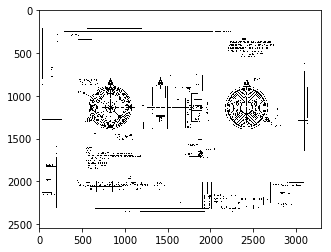

In [32]:
ed = cv2.imread("ed.png")
ed = cv2.cvtColor(ed, cv2.COLOR_BGR2GRAY)
plt.imshow(ed, cmap="gray")

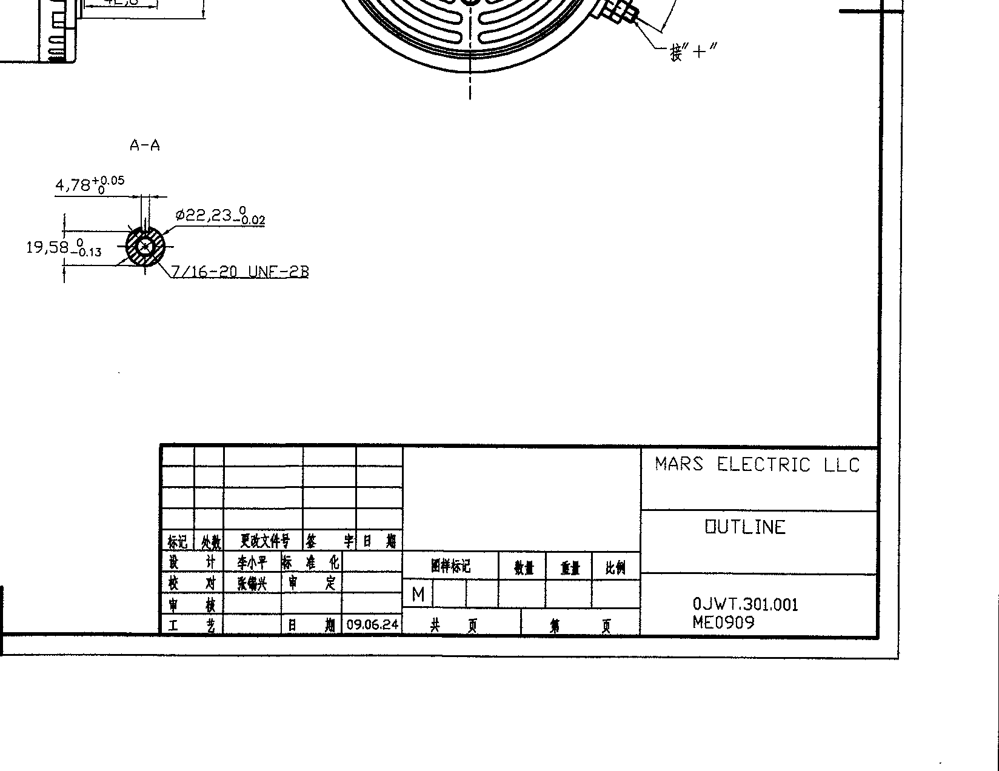

In [33]:
# Get lower right corner
#1/3 height and 1/2 width 
h, w = ed.shape[:2]
q_h, q_w = int(np.ceil(h/2)), int(np.ceil(w/2))
lower_right_ed = ed[q_h*1:, q_w*1:] 
# plt.imshow(lower_right_ed, cmap="gray")
cv2.imwrite("lower_right_ed.png", lower_right_ed)
Image.open("lower_right_ed.png")

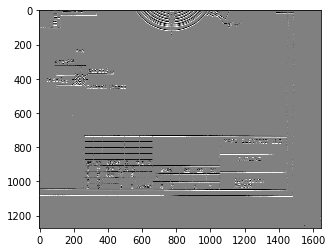

In [34]:
sobel_h = cv2.Sobel(lower_right_ed, cv2.CV_64F, 0, 1, ksize=7)
plt.imshow(sobel_h, cmap="gray")

(163200.0, -163200.0)

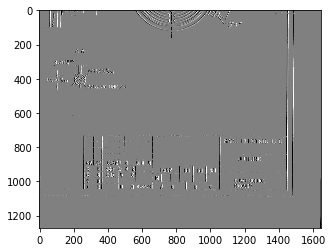

In [35]:
sobel_v = cv2.Sobel(lower_right_ed, cv2.CV_64F, 1, 0, ksize=7)
plt.imshow(sobel_v, cmap="gray")
sobel_v.max(), sobel_v.min()

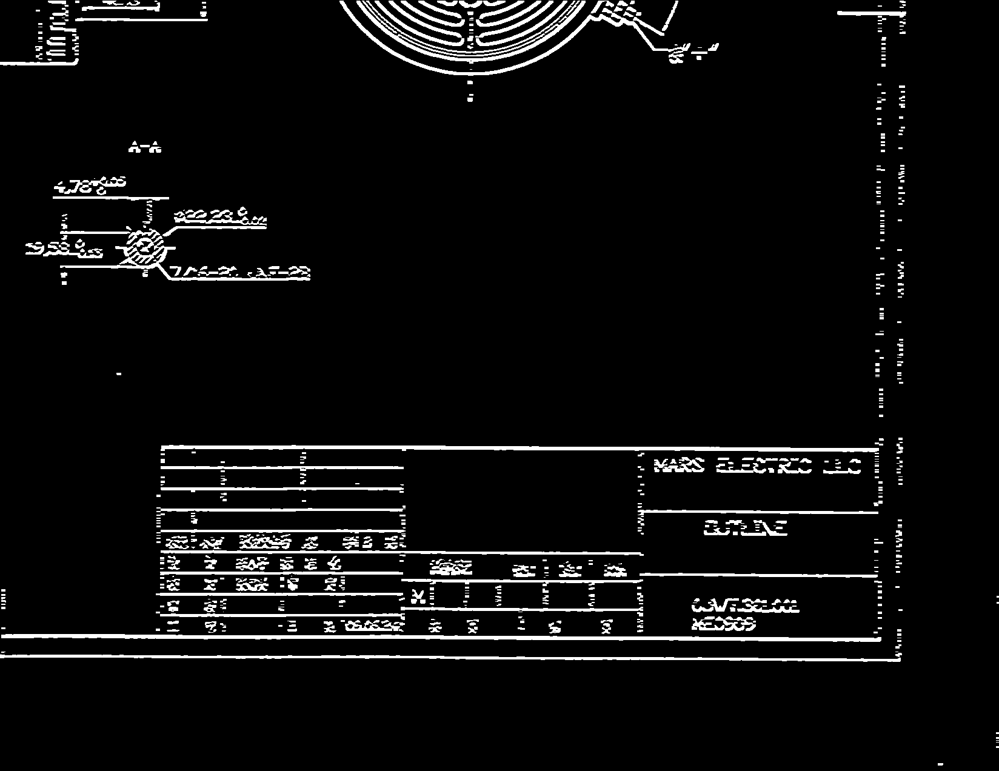

In [36]:
cv2.imwrite("sobel_h.png", sobel_h,)
sobel_hI = Image.open("sobel_h.png")
sobel_hI

### Erode the content

Morphological - https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_imgproc/py_morphological_ops/py_morphological_ops.html


## Erosion and Dilation of images using OpenCV in python

Morphological operations are a set of operations that process images based on shapes. They apply a structuring element to an input image and generate an output image.
The most basic morphological operations are two: Erosion and Dilation
Basics of Erosion:

    Erodes away the boundaries of foreground object
    Used to diminish the features of an image.

Working of erosion:

    A kernel(a matrix of odd size(3,5,7) is convolved with the image.
    A pixel in the original image (either 1 or 0) will be considered 1 only if all the pixels under the kernel is 1, otherwise it is eroded (made to zero).
    Thus all the pixels near boundary will be discarded depending upon the size of kernel.
    So the thickness or size of the foreground object decreases or simply white region decreases in the image.

Basics of dilation:

    Increases the object area
    Used to accentuate features

Working of dilation:

    A kernel(a matrix of odd size(3,5,7) is convolved with the image
    A pixel element in the original image is ‘1’ if atleast one pixel under the kernel is ‘1’.
    It increases the white region in the image or size of foreground object increases

Uses of Erosion and Dilation:

    Erosion:
        It is useful for removing small white noises.
        Used to detach two connected objects etc.
    Dilation:
        In cases like noise removal, erosion is followed by dilation. Because, erosion removes white noises, but it also shrinks our object. So we dilate it. Since noise is gone, they won’t come back, but our object area increases.
        It is also useful in joining broken parts of an object.

![alt text](http://what-when-how.com/wp-content/uploads/2012/07/tmp26dc188_thumb2.png)

In [0]:
# pprint(kernel)

Shape of errosion is (1272, 1648)


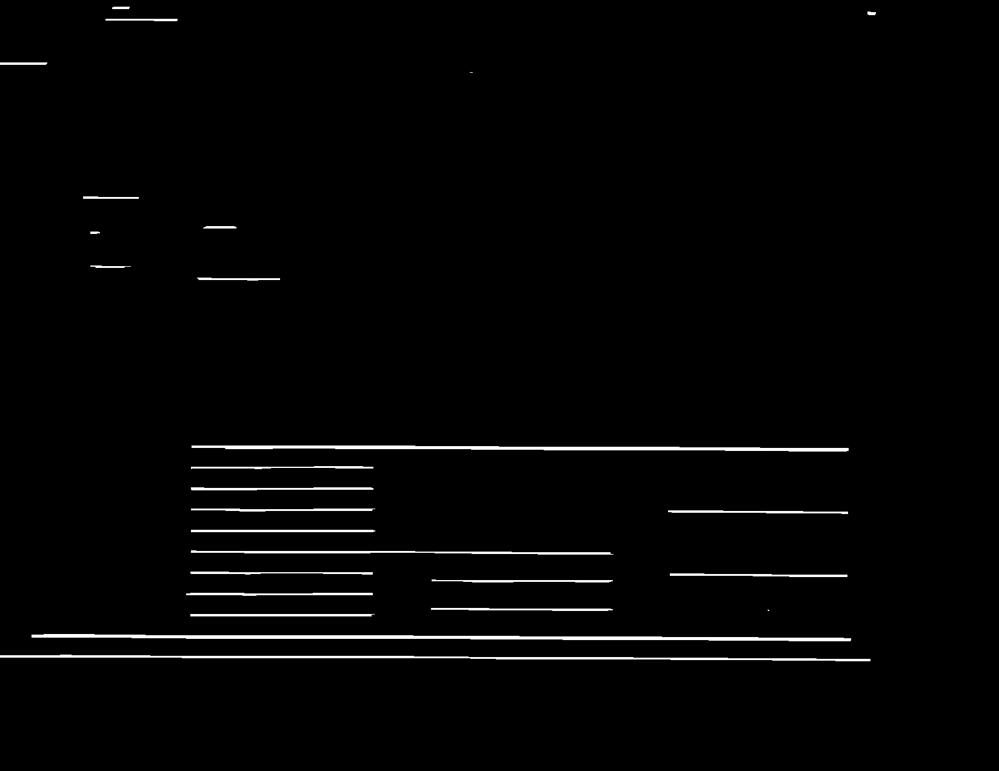

In [38]:
size = 51
kernel = np.zeros((size, size), np.uint8)
 
kernel[int(np.floor(size/2)), :] = 1

erosion_h = cv2.erode(sobel_h, kernel, iterations =2)
print(f"Shape of errosion is {erosion_h.shape}")
cv2_imshow(erosion_h)

In [39]:
erosion_h.shape

(1272, 1648)

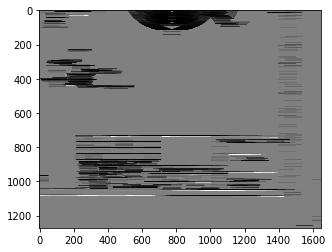

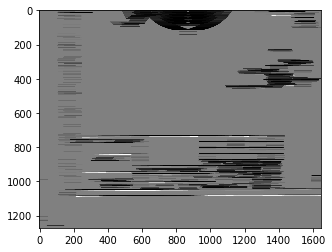

In [40]:
## Flipping of Images
plt.imshow(erosion_h, cmap="gray")
plt.show()
erosion_filpped = cv2.flip(erosion_h, 1)
plt.imshow(erosion_filpped, cmap="gray")
plt.show()

Shape of errosion is (1272, 1648)


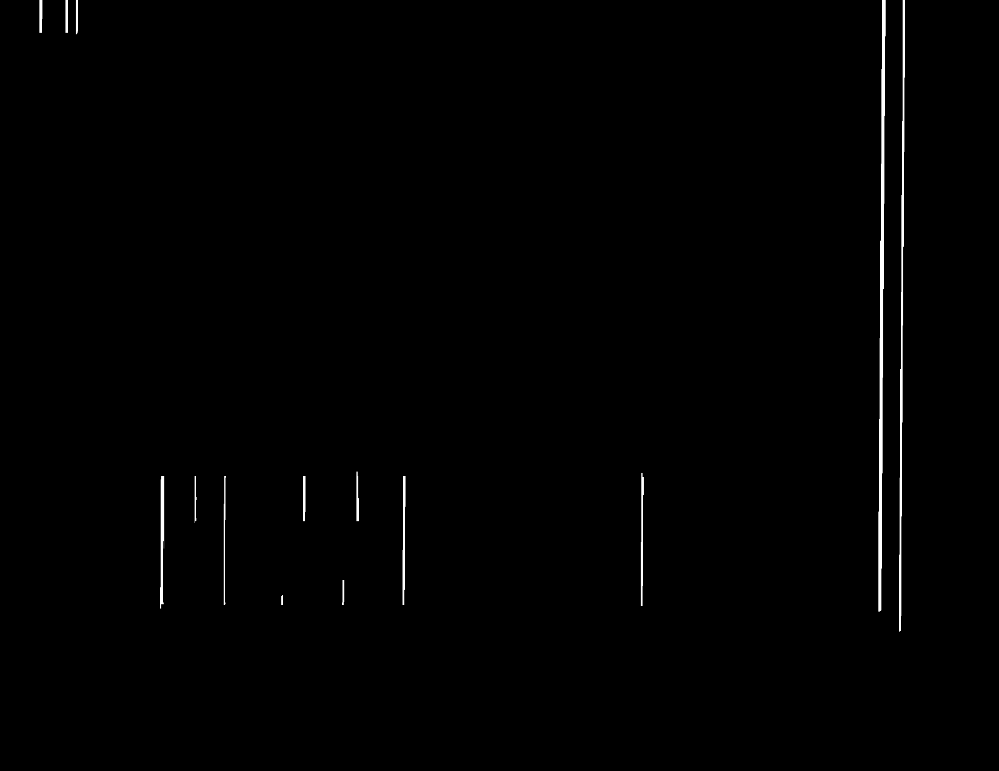

In [41]:
size = 51
kernel = np.zeros((size, size), np.uint8)
 
kernel[:, int(np.floor(size/2))] = 1

erosion_v = cv2.erode(sobel_v, kernel, iterations =2)
print(f"Shape of errosion is {erosion_v.shape}")
cv2_imshow(erosion_v)

# Addition and Blending of images

In [42]:
erosion_v.shape, erosion_h.shape

((1272, 1648), (1272, 1648))

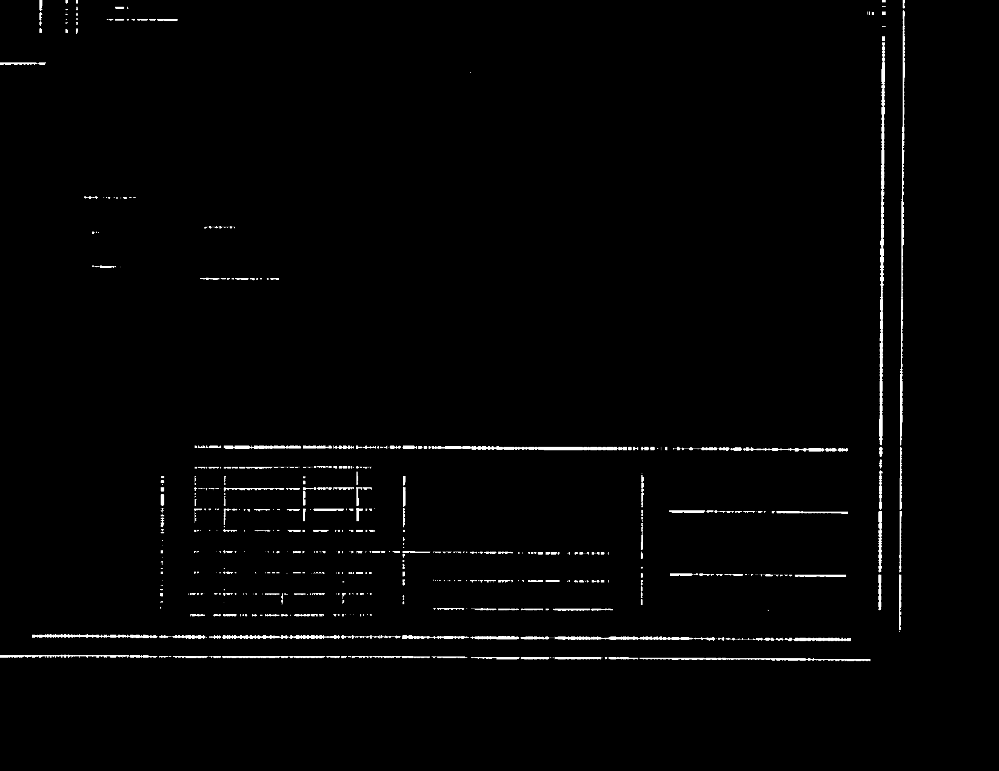

In [43]:
from google.colab.patches import cv2_imshow


erosion1 = cv2.add(erosion_v, erosion_h)
cv2_imshow(erosion1)

### Weighted Average adding Images

But sometimes we do not want to perform simple addition in image, so in this case we have blending. This is also image addition, but different weights are given to images so that it gives a feeling of blending or transparency. Images are added as per the equation below :

g(x) = (1 - a)f(x) + af1(x)

By varying a from 0 -> 1, you can perform a cool transition between one image to another. Here two images are taken to blend together. First image is given a weight of 0.3 and second image is given 0.7, cv2.addWeighted() applies following equation on the image :

img = a . img1 + b . img 2 + y



    Syntax: cv2.addWeighted(img1, wt1, img2, wt2, gammaValue)
    Parameters:
    img1: First Input Image array(Single-channel, 8-bit or floating-point)
    wt1: Weight of the first input image elements to be applied to the final image
    img2: Second Input Image array(Single-channel, 8-bit or floating-point)
    wt2: Weight of the second input image elements to be applied to the final image
    gammaValue: Measurement of light


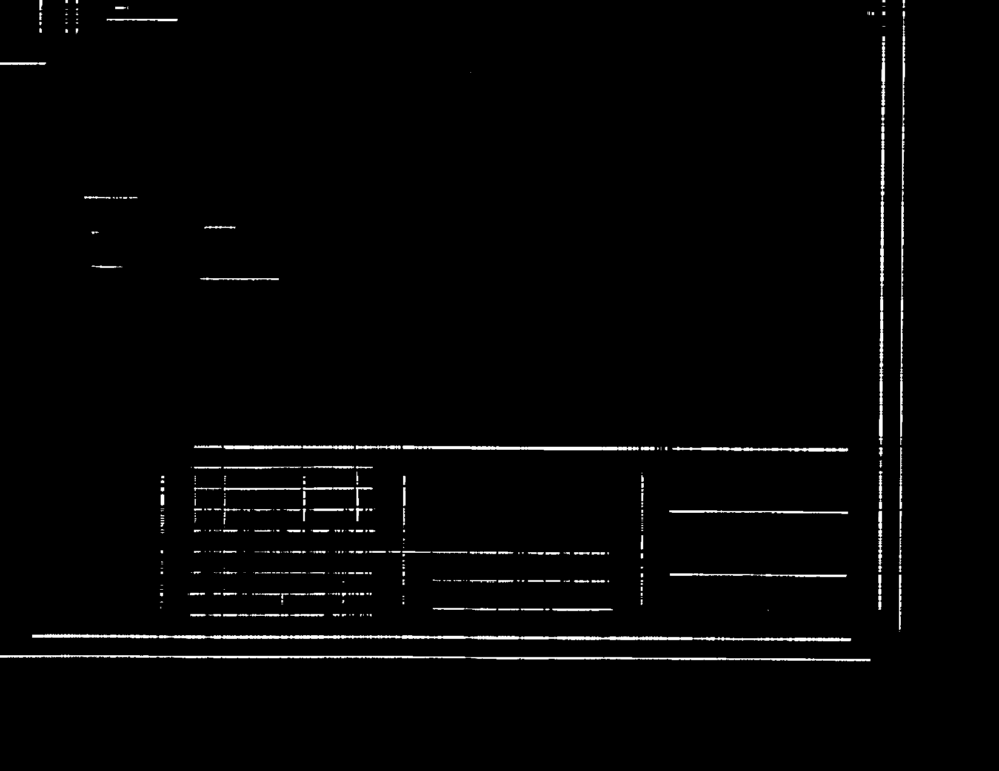

In [44]:
erosion2 = cv2.addWeighted(erosion_v, 0.4, erosion_h, 0.8, 0)
cv2_imshow(erosion2)

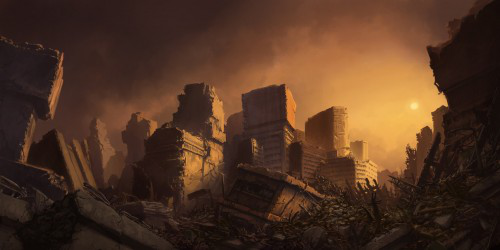

In [45]:
image1 = io.imread("https://cdncontribute.geeksforgeeks.org/wp-content/uploads/1-500x250-3.jpg")
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
cv2_imshow(image1)

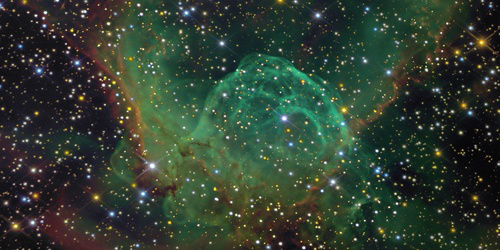

In [46]:
image2 = io.imread("https://cdncontribute.geeksforgeeks.org/wp-content/uploads/2-500x250-2.jpg")
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
cv2_imshow(image2)

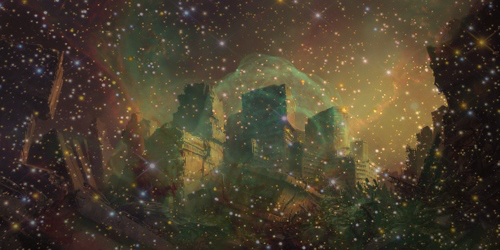

In [47]:
cv2_imshow(cv2.addWeighted(image1, 0.6, image2, 0.5, 0))

## Image Substraction

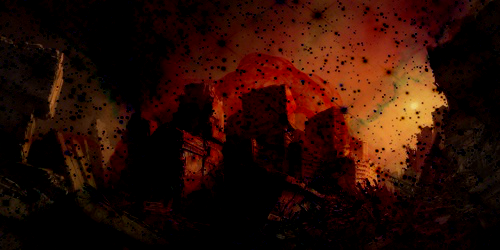

In [59]:
cv2_imshow(cv2.subtract(image1, image2))

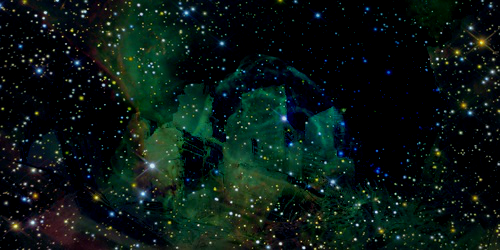

In [60]:
cv2_imshow(cv2.subtract(image2, image1))

## Background Removal 

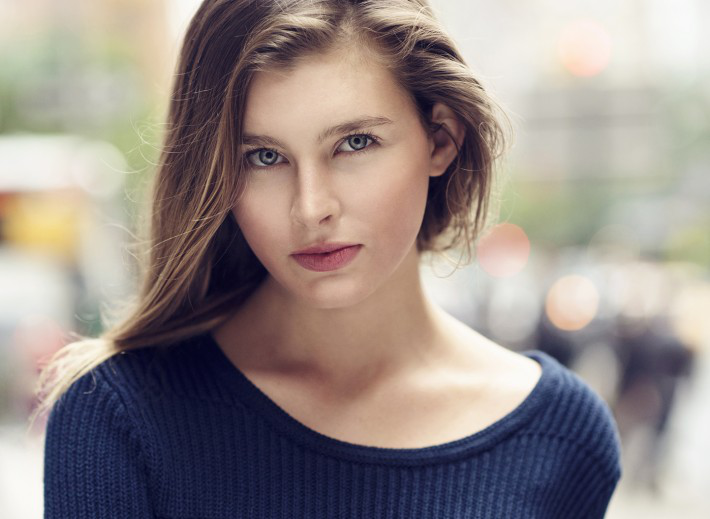

In [76]:
girl = io.imread("https://cdn.fstoppers.com/wp-content/uploads/2014/03/how-to-bokeh-get-dani-diamond-fstoppers-dof9-710x519.jpg")
girl = cv2.cvtColor(girl, cv2.COLOR_BGR2RGB)
cv2_imshow(girl)

In [0]:
bgr = cv2.BackgroundSubtractor()